### Histogram of Oriented Gradients 

In [ ]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import os
import glob
import time
import random
from tqdm import tqdm
from skimage.feature import hog
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.svm import LinearSVC
from scipy.ndimage.measurements import label
from collections import deque
import pickle
from sklearn.externals import joblib
%matplotlib inline

### Data Exploration

In [2]:
basedir = 'vehicles/'
image_types = os.listdir(basedir)
cars = []
for imtype in image_types:
    cars.extend(glob.glob(basedir+imtype+'/*'))

print("Number of Vehicle Images Found:",  len(cars))
with open("cars.txt", 'w') as f:
    for fn in cars:
        f.write(fn+'\n')
        
# Do the same thing for non-vehicle images
basedir = 'non-vehicles/'
image_types = os.listdir(basedir)
notcars = []
for imtype in image_types:
    notcars.extend(glob.glob(basedir+imtype+'/*'))

print ("Number of Non Vehicle Images found:", len(notcars))

with open("notcars.txt", 'w') as f:
    for fn in notcars:
        f.write(fn+'\n')
        


Number of Vehicle Images Found: 8797
Number of Non Vehicle Images found: 8968


Vehicles


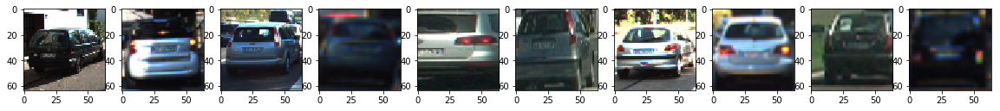

Non-vehicles


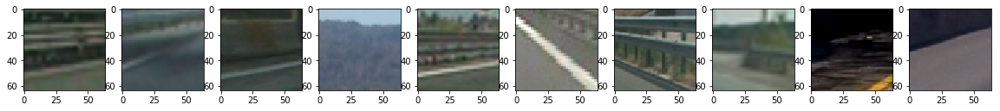

In [3]:
SAMPLE_SIZE = 10
vehicle_random_idxs = np.random.randint(0, high=len(cars)-1, size=SAMPLE_SIZE)
non_vehicle_random_idxs = np.random.randint(0, high=len(notcars)-1, size=SAMPLE_SIZE)

print('Vehicles')
f, ax = plt.subplots(1, SAMPLE_SIZE, figsize=(20, 10*SAMPLE_SIZE))
for i, idx in enumerate(vehicle_random_idxs):
    img = mpimg.imread(cars[idx])
    ax[i].imshow(img)
plt.show()

print('Non-vehicles')
f, ax = plt.subplots(1, SAMPLE_SIZE, figsize=(20, 10*SAMPLE_SIZE))
for i, idx in enumerate(non_vehicle_random_idxs):
    img = mpimg.imread(notcars[idx])
    ax[i].imshow(img)
plt.show()

In [ ]:
#What is the shape of cars and nonvar vehicles ?
templist = glob.glob('./vehicles/kiran/*.png')

for img in templist:
    image = mpimg.imread(img)
    car_width, car_height = image.shape[1], image.shape[0]
    print("car width ", car_width, "car height", car_height)



In [4]:
#### TUNABLE FEATURE PARAMETERS
color_space = 'YCrCb'
orient = 9
pix_per_cell = 8
cell_per_block = 2
hog_channel = 'ALL'
spatial_size = (32, 32)
hist_bins = 32
spatial_feat = True
hist_feat = True
hog_feat = True
block_norm = 'L2-Hys'

(3072,) float32


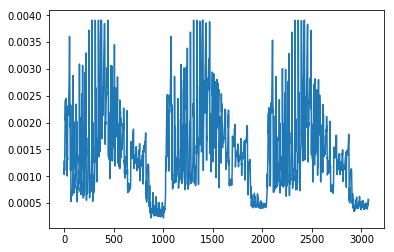

In [5]:
# ravel() transform multi array to single array
def bin_spatial(img, size=(32,32)):
    color1 = cv2.resize(img[:,:,0], size).ravel()
    color2 = cv2.resize(img[:,:,1], size).ravel()
    color3 = cv2.resize(img[:,:,2], size).ravel()
    return np.hstack((color1, color2, color3))

img = (mpimg.imread(cars[0]) / 256).astype(np.float32)
feature_vec = bin_spatial(img, size=(32,32))
print(feature_vec.shape, feature_vec.dtype)
plt.plot(feature_vec)

In [7]:
def visualize(fig, rows, cols, imgs, titles):
    for i, img in enumerate(imgs):
        plt.subplot(rows, cols, i+1)
        plt.title(i+1)
        img_dims = len(img.shape)

        if img_dims < 3:
            plt.imshow(img, cmap='hot')
            plt.title(titles[i])
        else:
            plt.imshow(img)
            plt.title(titles[i])            
   

### Color Histogram

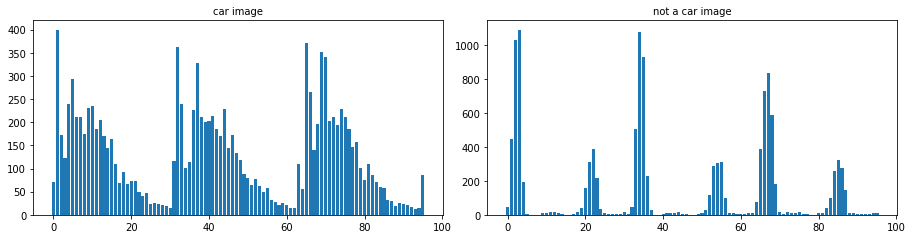

In [8]:
#Make sure bins are nbins=32 not bins_range=(0,256)
def color_hist(img, nbins=32):
    # compute the histogram of the RGB channels separately
    hist1 = np.histogram(img[:,:,0], bins=nbins)
    hist2 = np.histogram(img[:,:,1], bins=nbins)
    hist3 = np.histogram(img[:,:,2], bins=nbins)
    
    # generate bin centers
    bin_edges = hist1[1]
    bin_centers = bin_edges[1:] - 256 / nbins / 2

    # concatenate the histograms into a single feature vector
    hist_features = np.concatenate((hist1[0], hist2[0], hist3[0]))
    
    return hist_features

carimage = (mpimg.imread(cars[0]) / 256).astype(np.float32)
nocarimg = (mpimg.imread(notcars[3]) / 256).astype(np.float32)

hist_features_car = color_hist(carimage, nbins=32)
hist_features_noncar = color_hist(nocarimg, nbins=32)

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 3))
f.tight_layout()
ax1.bar(range(0, len(hist_features_car)), hist_features_car)
ax1.set_title('car image', fontsize=10)
ax2.bar(range(0, len(hist_features_noncar)), hist_features_noncar)
ax2.set_title('not a car image', fontsize=10)
plt.subplots_adjust(left=0, right=1, top=0.9, bottom=0.)


### Template Matching
Template matching is a technique for finding areas of an image that match (are similar) to a template image (patch).
``` cv2.matchTemplate(image, templ, method[, result]) → result ```
1. Template Matching Code Example [Compares Match Template](https://docs.opencv.org/2.4/modules/imgproc/doc/object_detection.html?highlight=matchtemplate#matchtemplate)
2. References [docs.opencv.org](https://docs.opencv.org/2.4.13.4/doc/tutorials/imgproc/histograms/template_matching/template_matching.html)

One of the ideas I Initially had was can template matching be used to keep track of the vehicles, so if I find a vehicle using sliding windows, capture the object and do template matching for that object, will this work ?

Let's find out.


In [9]:
def draw_boxes(img, bboxes, color=(0, 0, 1), thick=6):
    draw_img = np.copy(img)
    for bbox in bboxes:
        cv2.rectangle(draw_img, bbox[0], bbox[1], color, thick)
    return draw_img


(<matplotlib.image.AxesImage at 0x7faaa1610668>,
 <matplotlib.text.Text at 0x7faaa1660198>)

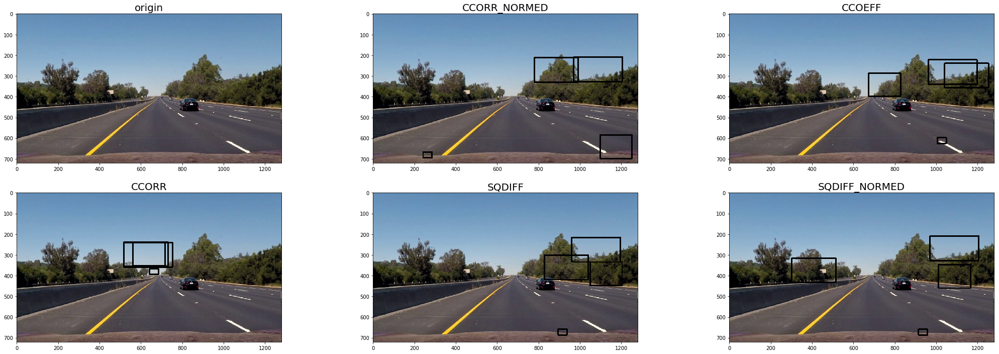

In [10]:
def template_matching(img, templates, method):
    bbox_list = []
    for template in templates:
        temp_img = mpimg.imread(template)
        match = cv2.matchTemplate(img, temp_img, method)
        min_val, max_val, min_loc, max_loc = cv2.minMaxLoc(match)
        w, h = (temp_img.shape[1], temp_img.shape[0])
    
        if method in [cv2.TM_SQDIFF, cv2.TM_SQDIFF_NORMED]:
            left_top = min_loc
        else:
            left_top = max_loc
    
        right_bottom = (left_top[0] + w, left_top[1] + h)
        bbox_list.append((left_top, right_bottom))
    return bbox_list


image = mpimg.imread('video_images/orig_frame_1228.jpg')
templist = glob.glob('video_images/template*.jpg')

bboxes_CCORR_NORMED = template_matching(image, templist, cv2.TM_CCORR_NORMED)
result_CCORR_NORMED = draw_boxes(image, bboxes_CCORR_NORMED)
bboxes_CCOEFF = template_matching(image, templist, cv2.TM_CCOEFF)
result_CCOEFF = draw_boxes(image, bboxes_CCOEFF)
bboxes_CCORR = template_matching(image, templist, cv2.TM_CCORR)
result_CCORR = draw_boxes(image, bboxes_CCORR)
bboxes_SQDIFF = template_matching(image, templist, cv2.TM_SQDIFF)
result_SQDIFF = draw_boxes(image, bboxes_SQDIFF)
bboxes_SQDIFF_NORMED = template_matching(image, templist, cv2.TM_SQDIFF_NORMED)
result_SQDIFF_NORMED = draw_boxes(image, bboxes_SQDIFF_NORMED)

f, axs = plt.subplots(2, 3, figsize=(36, 12))
axs[0][0].imshow(image), axs[0][0].set_title('origin', fontsize=20)
axs[0][1].imshow(result_CCORR_NORMED), axs[0][1].set_title('CCORR_NORMED', fontsize=20)
axs[0][2].imshow(result_CCOEFF), axs[0][2].set_title('CCOEFF', fontsize=20)
axs[1][0].imshow(result_CCORR), axs[1][0].set_title('CCORR', fontsize=20)
axs[1][1].imshow(result_SQDIFF), axs[1][1].set_title('SQDIFF', fontsize=20)
axs[1][2].imshow(result_SQDIFF_NORMED), axs[1][2].set_title('SQDIFF_NORMED', fontsize=20)

As it is evident from the above experimentation, Template matching will not work and trying to find the matched object will be 
a futile exercise and can come up with lot of false positives defeating the whole purpose.

#### Extract Histogram of Oriented Gradients (HOG) for a given image.

```skimage.feature.hog(image, orientations=9, pixels_per_cell=(8, 8), cells_per_block=(3, 3), block_norm=None, visualize=False, visualise=None, transform_sqrt=False, feature_vector=True, multichannel=None)```

1. [histogram of Oriented Gradients](https://en.wikipedia.org/wiki/Histogram_of_oriented_gradients)  
2. [HOG Image](http://scikit-image.org/docs/dev/api/skimage.feature.html#skimage.feature.hog) 


(1764,) float64


(<matplotlib.image.AxesImage at 0x7faaa1492198>,
 <matplotlib.text.Text at 0x7faaa14e9208>)

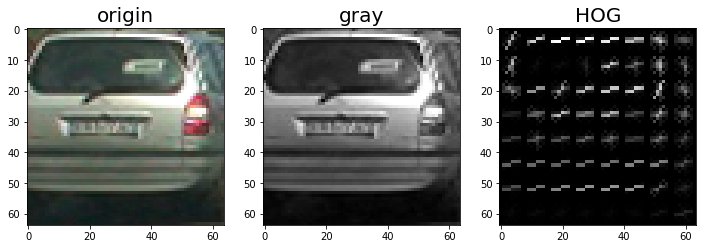

In [11]:
#Define a function to return HOG features and Visualization
def get_hog_features(img, orient, pix_per_cell, cell_per_block, vis=False, feature_vec=True):
    if vis == True:
        features, hog_image = hog(img, orientations=orient, pixels_per_cell=(pix_per_cell, pix_per_cell),
                                  cells_per_block=(cell_per_block, cell_per_block), block_norm='L2-Hys', transform_sqrt=False, 
                                  visualise=vis, feature_vector=feature_vec)
        return features, hog_image
    else:
        features = hog(img, orientations=orient, pixels_per_cell=(pix_per_cell, pix_per_cell),
                                  cells_per_block=(cell_per_block, cell_per_block), block_norm='L2-Hys', transform_sqrt=False,
                                  visualise=vis, feature_vector=feature_vec)
        return features
    

origin = mpimg.imread(cars[0])
image = (mpimg.imread(cars[0]) / 256).astype(np.float32)
gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
features, hog_image = get_hog_features(gray, orient, pix_per_cell, cell_per_block, vis=True, feature_vec=True)
print(features.shape, features.dtype)

f, axs = plt.subplots(1, 3, figsize=(12, 6))
axs[0].imshow(origin), axs[0].set_title('origin', fontsize=20)
axs[1].imshow(gray, cmap='gray'), axs[1].set_title('gray', fontsize=20)
axs[2].imshow(hog_image, cmap='gray'), axs[2].set_title('HOG', fontsize=20)
    
    
    

### Extract Color Features

In [ ]:
def extract_color_features(imgs, spatial_size=(32,32), hist_bins=32):
    features = []
    for frame in imgs:
        img = mpimg.imread(frame)
        spat_features = bin_spatial(img, size=spatial_size)
        hist_features = color_hist(img, nbins=hist_bins)
        features.append(np.concatenate((spat_features, hist_features)))
    return features

car_features = extract_color_features(cars, spatial_size=(32,32), hist_bins=32)
notcar_features = extract_color_features(notcars, spatial_size=(32,32), hist_bins=32)

y = np.hstack((np.ones(len(car_features)), np.zeros(len(notcar_features))))
X = np.vstack((car_features, notcar_features)).astype(np.float64)
X_scaler = StandardScaler().fit(X)
scaled_X = X_scaler.transform(X)

rand_state = np.random.randint(0, 100)
x_train, x_test, y_train, y_test = train_test_split(scaled_X, y, test_size=0.2, random_state=rand_state)
svc = LinearSVC()
svc.fit(x_train, y_train)
print(svc.score(x_test, y_test))

car_ind = np.random.randint(0, len(cars))
f, axs = plt.subplots(1, 3, figsize=(12, 6))
axs[0].imshow(mpimg.imread(cars[car_ind])), axs[0].set_title('origin', fontsize=20)
axs[1].plot(X[car_ind]), axs[1].set_title('X', fontsize=20)
axs[2].plot(scaled_X[car_ind]), axs[2].set_title('scaled X', fontsize=20)

### Normalize Features and Classify

In [12]:
# Define a function to extract features from a list of images
# Have this function call bin_spatial() and color_hist()
def extract_features(imgs, color_space='RGB', spatial_size=(32, 32),
                        hist_bins=32, orient=9, 
                        pix_per_cell=8, cell_per_block=2, hog_channel=0,
                        spatial_feat=True, hist_feat=True, hog_feat=True):
    # Create a list to append feature vectors to
    features = []
    # Iterate through the list of images
    for file in tqdm(imgs):
        file_features = []
        # Read in each one by one
        # image = mpimg.imread(file)  image should be [0, 1] and as type np.float32
        image = mpimg.imread(file)
        # apply color conversion if other than 'RGB'
        if color_space != 'RGB':
            if color_space == 'HSV':
                feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2HSV)
            elif color_space == 'LUV':
                feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2LUV)
            elif color_space == 'HLS':
                feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2HLS)
            elif color_space == 'YUV':
                feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2YUV)
            elif color_space == 'YCrCb':
                feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2YCrCb)
        else: feature_image = np.copy(image)      

        if spatial_feat == True:
            spatial_features = bin_spatial(feature_image, size=spatial_size)
            file_features.append(spatial_features)

        if hist_feat == True:
            # Apply color_hist()
            hist_features = color_hist(feature_image, nbins=hist_bins)
            file_features.append(hist_features)
#             print(hist_features.shape, hist_features.dtype)
        if hog_feat == True:
            # Call get_hog_features() with vis=False, feature_vec=True
            if hog_channel == 'ALL':
                hog_features = []
                for channel in range(feature_image.shape[2]):
                    hog_features.append(get_hog_features(feature_image[:,:,channel], 
                                        orient, pix_per_cell, cell_per_block))
                hog_features = np.ravel(hog_features)        
            else:
                hog_features = get_hog_features(feature_image[:,:,hog_channel], orient, 
                            pix_per_cell, cell_per_block)
         # Append the new feature vector to the features list
        file_features.append(hog_features)
        file_features = np.concatenate(file_features)
        features.append(file_features)
    # Return list of feature vectors
    return features


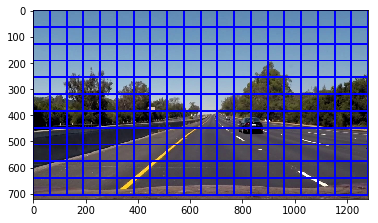

In [13]:
def slide_window(img, x_start_stop=[None, None], y_start_stop=[None, None], xy_window=(64, 64), xy_overlap=(0.5, 0.5)):
    # if x and/or y start/stop positions not defined, set to image size
    if x_start_stop[0] == None:
        x_start_stop[0] = 0
    if x_start_stop[1] == None:
        x_start_stop[1] = img.shape[1]
    if y_start_stop[0] == None:
        y_start_stop[0] = 0
    if y_start_stop[1] == None:
        y_start_stop[1] = img.shape[0]
        
    # compute the span of the region to be searched
    xspan = x_start_stop[1] - x_start_stop[0]
    yspan = y_start_stop[1] - y_start_stop[0]
        
    # compute the number of pixels per step in x/y
    nx_pix_per_step = np.int(xy_window[0] * (1 - xy_overlap[0]))
    ny_pix_per_step = np.int(xy_window[1] * (1 - xy_overlap[1]))
    
    # compute the number of windows in x/y
    nx_buffer = np.int(xy_window[0] * xy_overlap[0])
    ny_buffer = np.int(xy_window[1] * xy_overlap[1])
    nx_windows = np.int((xspan - nx_buffer) / nx_pix_per_step)
    ny_windows = np.int((yspan - ny_buffer) / ny_pix_per_step)
    
    window_list = []
    for ys in range(ny_windows):
        for xs in range(nx_windows):
            # calculate window position
            x_start = xs * nx_pix_per_step + x_start_stop[0]
            x_end = x_start + xy_window[0]
            y_start = ys * ny_pix_per_step + y_start_stop[0]
            y_end = y_start + xy_window[1]
            window_list.append(((x_start, y_start), (x_end, y_end)))
    return window_list

img = mpimg.imread('video_images/orig_frame_1228.jpg')
windows = slide_window(img, x_start_stop=[None, None], y_start_stop=[None, None], xy_window=(128, 128), xy_overlap=(0.5, 0.5))
window_img = draw_boxes(img, windows, color=(0,0,255), thick=6)
plt.imshow(window_img)

### Search and Classify

In [14]:
# extract features for a single image
def single_img_features(img, color_space='RGB', spatial_size=(32,32), hist_bins=32, 
                        orient=9, pix_per_cell=8, cell_per_block=2, hog_channel=0, 
                        spatial_feat=True, hist_feat=True, hog_feat=True, vis=False):
    img_features=[]
    
    if color_space != 'RGB':
        if color_space == 'HSV':
            feature_image = cv2.cvtColor(img, cv2.COLOR_RGB2HSV)
        if color_space == 'LUV':
            feature_image = cv2.cvtColor(img, cv2.COLOR_RGB2LUV)
        if color_space == 'HLS': 
            feature_image = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
        if color_space == 'YUV':
            feature_image = cv2.cvtColor(img, cv2.COLOR_RGB2YUV)
        if color_space == 'YCrCb':
            feature_image = cv2.cvtColor(img, cv2.COLOR_RGB2YCrCb)
    else: 
        feature_image = np.copy(img)
        
    if spatial_feat == True:
        spat_features = bin_spatial(feature_image, size=spatial_size)
        img_features.append(spat_features)
    
    if hist_feat == True:
        hist_features = color_hist(feature_image, nbins=hist_bins)
        img_features.append(hist_features)
    
    if hog_feat == True:
        if hog_channel=='ALL':
            hog_features = []
            for channel in range(feature_image.shape[2]):
                hog_features.extend(get_hog_features(feature_image[:,:,channel], orient,
                                    pix_per_cell,cell_per_block, vis=vis, feature_vec=True))
        else:
            if vis == True:
                hog_features, hog_image_2 = get_hog_features(feature_image[:,:,hog_channel], orient, pix_per_cell,
                                        cell_per_block, vis=vis, feature_vec=True)
            else:
                 hog_features = get_hog_features(feature_image[:,:,hog_channel], orient, pix_per_cell,
                                        cell_per_block, vis=vis, feature_vec=True)
                    
        img_features.append(hog_features)
        
    if vis == True:
        return np.concatenate(img_features), hog_image_2
    else:
        return np.concatenate(img_features)

In [15]:
# search the given windows in the image
def search_windows(img, windows, clf, scaler, color_space='RGB', spatial_size=(32,32), 
                   hist_bins=32, orient=9, pix_per_cell=8, cell_per_block=2, hog_channel=0,
                   spatial_feat=True, hist_feat=True, hog_feat=True):
    on_windows = []
    for window in windows:
        # extract the test window from original window resize for 64,64 due to all training images are 64,64
        test_img = cv2.resize(img[window[0][1]:window[1][1], window[0][0]:window[1][0]], (64,64))
        # extract features for that window using single_img_features
        features = single_img_features(test_img, color_space=color_space, spatial_size=spatial_size, hist_bins=hist_bins, 
                                       orient=orient, pix_per_cell=pix_per_cell, cell_per_block=cell_per_block, 
                                       hog_channel=hog_channel, spatial_feat=spatial_feat, hist_feat=hist_feat, hog_feat=hog_feat)
        # scale extracted features to be fed to classifier
        test_features = scaler.transform(np.array(features).reshape(1,-1))
        # predict using classifier
        prediction = clf.predict(test_features)
        if prediction == 1:
            on_windows.append(window)
    
    return on_windows

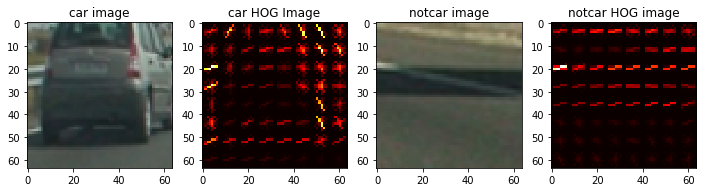

In [16]:
#Choose random car / not car indices
color_space = 'YCrCb'
orient = 9
pix_per_cell = 8
cell_per_block = 2
hog_channel = 0
spatial_size = (32, 32)
hist_bins = 32
spatial_feat = True
hist_feat = True
hog_feat = True

car_ind = np.random.randint(0, len(cars))
notcar_ind = np.random.randint(0, len(notcars))


#Read in car / not -car images
car_image = mpimg.imread(cars[car_ind])
notcar_image = mpimg.imread(notcars[notcar_ind])


car_features, car_hog_image = single_img_features(car_image, color_space=color_space, spatial_size=spatial_size,
                                                  hist_bins=hist_bins, orient=orient,
                                                  pix_per_cell=pix_per_cell, cell_per_block=cell_per_block,
                                                  hog_channel=hog_channel, spatial_feat=spatial_feat, hist_feat=hist_feat, hog_feat=hog_feat, vis=True)
                                                  

notcar_features, notcar_hog_image = single_img_features(notcar_image, color_space=color_space, spatial_size=spatial_size,
                                                  hist_bins=hist_bins, orient=orient, pix_per_cell=pix_per_cell, cell_per_block=cell_per_block,
                                                  hog_channel=hog_channel, spatial_feat=spatial_feat, hist_feat=hist_feat, hog_feat=hog_feat, vis=True)

images = [car_image, car_hog_image, notcar_image, notcar_hog_image]
titles = ['car image', 'car HOG Image', 'notcar image', 'notcar HOG image']
fig = plt.figure(figsize=(12, 3))
visualize(fig, 1, 4, images, titles)


In [17]:
import time
from sklearn.svm import SVC
from sklearn.model_selection import RandomizedSearchCV
from sklearn.model_selection import GridSearchCV

#### TUNABLE FEATURE PARAMETERS
color_space = 'YCrCb'
orient = 9
pix_per_cell = 8
cell_per_block = 2
hog_channel = 'ALL'
spatial_size = (32, 32)
hist_bins = 32
spatial_feat = True
hist_feat = True
hog_feat = True

t = time.time()
n_samples = 1000
random_idxs = np.random.randint(0, len(cars), n_samples)

#### smaller data set ####
#test_cars = np.array(cars)[random_idxs]
#test_notcars = np.array(notcars)[random_idxs]
#####
test_cars = cars
test_notcars = notcars


car_features = extract_features(test_cars, color_space = color_space, spatial_size=spatial_size, hist_bins=hist_bins,
                                orient=orient, pix_per_cell=pix_per_cell, cell_per_block=cell_per_block, hog_channel=hog_channel,
                               spatial_feat=spatial_feat, hist_feat=hist_feat, hog_feat=hog_feat)

notcar_features = extract_features(test_notcars, color_space = color_space, spatial_size=spatial_size, hist_bins=hist_bins,
                                orient=orient, pix_per_cell=pix_per_cell, cell_per_block=cell_per_block, hog_channel=hog_channel,
                               spatial_feat=spatial_feat, hist_feat=hist_feat, hog_feat=hog_feat)


print(time.time()-t, 'Seconds to compute features ...')

X = np.vstack((car_features, notcar_features)).astype(np.float64)
#Fit per X column
X_scaler = StandardScaler().fit(X)

#Apply the scaler to X
scaled_X = X_scaler.transform(X)


# Define the labels vector
y = np.hstack ((np.ones(len(car_features)), np.zeros(len(notcar_features))))

#split the data into randomized training and test sets

rand_state = np.random.randint(0,100)
X_train, X_test, y_train, y_test = train_test_split(scaled_X, y, test_size=0.1, random_state = rand_state)


print('Using:', orient, 'Orientation', pix_per_cell, 'pixels per cell', cell_per_block, 'cells_per_block',
      hist_bins, 'histogram bins',  spatial_size, 'spatial size')

print('Feature Vector Length', len(X_train[0]))

#linear SVC
clf = LinearSVC()

'''
# I am abandoning the LinearSVC if the GridSearchCV succeeds
parameters = {'kernel':('linear', 'rbf'), 'C':[1, 10]}
svr = SVC()
# aGrid = aML_GS.GridSearchCV( aClassifierOBJECT, param_grid = aGrid_of_parameters, cv = cv, n_jobs = n_JobsOnMultiCpuCores, verbose = 5 )

clf = GridSearchCV(svr, parameters, n_jobs=8, verbose=5)

I am abandoning the GriSearchCV as well inspite of getting 99.9% accuracy, since it takes long time 

'''


#Check the training time for the SVC
t = time.time()
clf.fit(X_train, y_train)
print(round(time.time()-t, 2), 'Seconds to train clf ....')

#Check the score of the SVC
print('Test Accuracy of clf = ', round(clf.score(X_test, y_test), 4))

100%|██████████| 8968/8968 [00:59<00:00, 151.72it/s]


115.67009997367859 Seconds to compute features ...
Using: 9 Orientation 8 pixels per cell 2 cells_per_block 32 histogram bins (32, 32) spatial size
Feature Vector Length 8460
24.95 Seconds to train clf ....
Test Accuracy of clf =  0.9899


In [ ]:
import os
import pickle
from sklearn.externals import joblib

MODELS_PATH = './models'
#ts = int(time.time())
ts = 5
model_type = 'gridsearchcv'
model_name = "{}-{}.pkl".format(model_type, ts)
scaler_name = "{}-scaler-{}.pkl".format(model_type, ts)
joblib.dump(clf, open(os.path.join(MODELS_PATH, model_name), "wb"))
pickle.dump(X_scaler, open(os.path.join(MODELS_PATH, scaler_name), "wb"))
print('Saved {} {}'.format(model_name, scaler_name))

In [ ]:
ts = 101
from sklearn.externals import joblib
MODELS_PATH = './models'
model_type = 'gridsearchcv'
model_name = "{}-{}.pkl".format(model_type, ts)
scaler_name = "{}-scaler-{}.pkl".format(model_type, ts)
clf = joblib.load(open(os.path.join(MODELS_PATH, model_name), "rb"))
X_scaler = pickle.load(open(os.path.join(MODELS_PATH, scaler_name), "rb"))
print('Loaded {}, {}'.format(model_name, scaler_name))

0.0 1.0
0.651634931564331 seconds to process one image searching 100 windows
0.0 1.0
0.678415060043335 seconds to process one image searching 100 windows
0.0 1.0
0.6555237770080566 seconds to process one image searching 100 windows
0.0 1.0
0.6256985664367676 seconds to process one image searching 100 windows
0.0 1.0
0.6218581199645996 seconds to process one image searching 100 windows
0.0 1.0
0.620711088180542 seconds to process one image searching 100 windows
0.0 1.0
0.6260092258453369 seconds to process one image searching 100 windows
0.0 1.0
0.6261606216430664 seconds to process one image searching 100 windows
0.0 1.0
0.6228435039520264 seconds to process one image searching 100 windows
0.0 1.0
0.6187667846679688 seconds to process one image searching 100 windows
0.0 1.0
0.6268861293792725 seconds to process one image searching 100 windows
0.0 1.0
0.6226487159729004 seconds to process one image searching 100 windows
0.0 1.0
0.6235928535461426 seconds to process one image searching 1

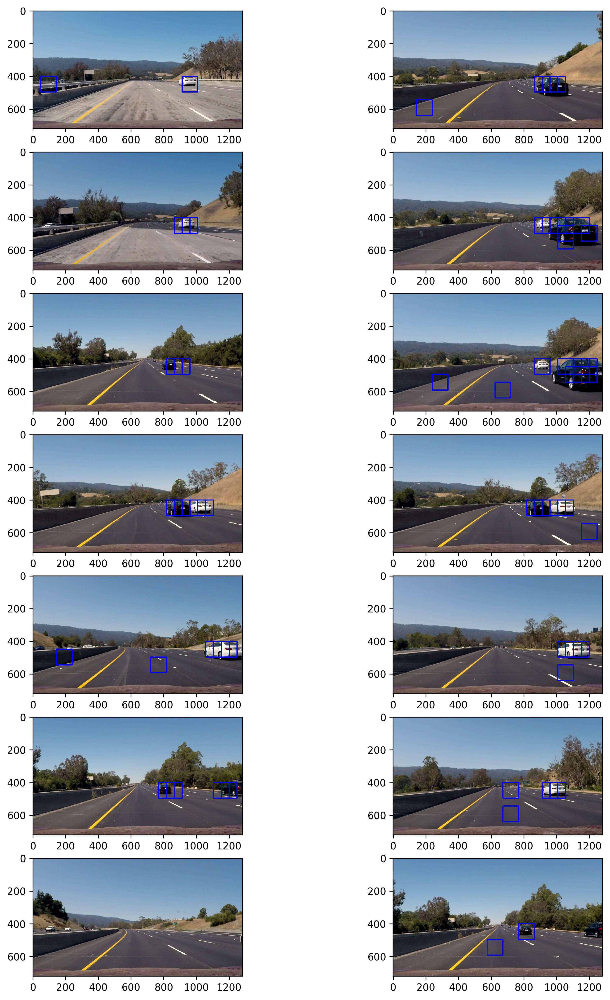

In [18]:
example_images = glob.glob('video_images/orig_*.jpg')
images = []
titles = []

#Min Max for y to search in slide_window
y_start_stop = [400, 656]
overlap = 0.5

for img_src in example_images:
    t1 = time.time()
    img = mpimg.imread(img_src)
    draw_img = np.copy(img)
    img = img.astype(np.float32)/255
    print(np.min(img), np.max(img))
   
    windows = slide_window(img, x_start_stop=[None, None], y_start_stop=y_start_stop,
                          xy_window=(96,96), xy_overlap=(overlap, overlap))
    
    hot_windows = search_windows(img, windows, clf, X_scaler, color_space= color_space,
                                 spatial_size=spatial_size, hist_bins=hist_bins, orient=orient,
                                 pix_per_cell=pix_per_cell, cell_per_block=cell_per_block,
                                 hog_channel=hog_channel, spatial_feat=spatial_feat,
                                 hist_feat=hist_feat, hog_feat=hog_feat)

    window_img = draw_boxes(draw_img, hot_windows, color=(0, 0, 255), thick=6)
    images.append(window_img)
    titles.append('')
    print(time.time()-t1, 'seconds to process one image searching', len(windows), 'windows')

fig = plt.figure(figsize=(12,18), dpi=300)
visualize(fig, 7, 2, images, titles)

### Sub Sampling Window

0.47031283378601074 seconds to process one image searching
0.39487528800964355 seconds to process one image searching
0.467315673828125 seconds to process one image searching
0.3934793472290039 seconds to process one image searching
0.40419816970825195 seconds to process one image searching
0.43889641761779785 seconds to process one image searching


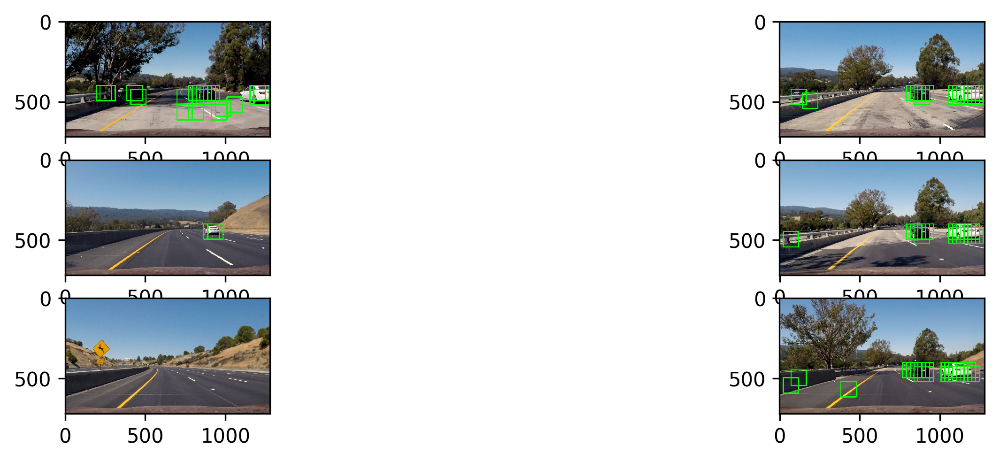

In [19]:
def find_cars(img, ystart, ystop, scale, clf, x_scaler, orient, pix_per_cell, cell_per_block, spatial_size, hist_bins):
    draw_img = np.copy(img)
    img = img.astype(np.float32) / 255
    bbox_list = []
    
    img_search = img[ystart:ystop,:,:]
    ctrans_search = cv2.cvtColor(img_search, cv2.COLOR_RGB2YCrCb)
    if scale != 1:
        imshape = ctrans_search.shape 
        ctrans_search = cv2.resize(ctrans_search, (np.int(imshape[1]/scale), np.int(imshape[0]/scale))) 
    
    ch1 = ctrans_search[:,:,0]
    ch2 = ctrans_search[:,:,1]
    ch3 = ctrans_search[:,:,2]
    
    nxblock = (ctrans_search.shape[1] // pix_per_cell) - cell_per_block + 1
    nyblock = (ctrans_search.shape[0] // pix_per_cell) - cell_per_block + 1
    nfeat_per_block = orient * cell_per_block ** 2
        
    # 64 was the original sampling rate, with 8 cells and 8 pix per cell
    window = 64
    block_per_window = (window // pix_per_cell) - cell_per_block + 1 # 7
    cells_per_step = 2 # instead of overlap, define how many cells to step
    nxsteps = (nxblock - block_per_window) // cells_per_step + 1 # 50
    nysteps = (nyblock - block_per_window) // cells_per_step + 1 # 7
    
    # compute individual channel HOG features (20, 105, 2, 2, 9)
    hog1 = get_hog_features(ch1, orient, pix_per_cell, cell_per_block, feature_vec=False)
    hog2 = get_hog_features(ch2, orient, pix_per_cell, cell_per_block, feature_vec=False)
    hog3 = get_hog_features(ch3, orient, pix_per_cell, cell_per_block, feature_vec=False)
    
    for xs in range(nxsteps):
        for ys in range(nysteps):
            ypos = ys * cells_per_step
            xpos = xs * cells_per_step     
            
            hog_feat1 = hog1[ypos:ypos+block_per_window, xpos:xpos+block_per_window].ravel()
            hog_feat2 = hog2[ypos:ypos+block_per_window, xpos:xpos+block_per_window].ravel()
            hog_feat3 = hog3[ypos:ypos+block_per_window, xpos:xpos+block_per_window].ravel()
            hog_features = np.hstack((hog_feat1, hog_feat2, hog_feat3))
            
            xleft = xpos * pix_per_cell
            ytop = ypos * pix_per_cell   
            
            subimg = cv2.resize(ctrans_search[ytop:ytop+window, xleft:xleft+window], (64, 64)) # (64, 64, 3)
            # get color features
            spatial_features = bin_spatial(subimg, size=spatial_size)
            hist_features = color_hist(subimg, nbins=hist_bins)
            # scale features and make a perdiction  (3072,) (96,) (5292,)
            features = np.hstack((spatial_features, hist_features, hog_features)).reshape(1,-1)
            scaled_features = x_scaler.transform(features)
            prediction = clf.predict(scaled_features)
                  
            if prediction == 1:
                xleft = np.int(xleft * scale)
                ytop = np.int(ytop * scale)
                win_draw = np.int(window * scale)
                cv2.rectangle(draw_img, (xleft, ytop+ystart), (xleft+win_draw, ytop+win_draw+ystart), (0,255,0), 6)                                           
                bbox_list.append(((int(xleft), int(ytop+ystart)), (int(xleft+win_draw), int(ytop+win_draw+ystart)))) 
            
    return draw_img, bbox_list

ystart = 400
ystop = 656
scale = 1.5
result_list = []
titles = []

test_images = glob.glob('./test_images/test*.jpg')
for img in test_images:
    t1 = time.time()
    img = mpimg.imread(img)
    result, bbox_list = find_cars(img, ystart, ystop, scale, clf, X_scaler, orient, pix_per_cell, cell_per_block,            spatial_size, hist_bins)
    result_list.append(result)
    titles.append('')
    print(time.time()-t1, 'seconds to process one image searching')
    
    
fig = plt.figure(figsize=(12,18), dpi=300)
visualize(fig, 14, 2, result_list, titles)    


#### Multiple Detection and False Positives

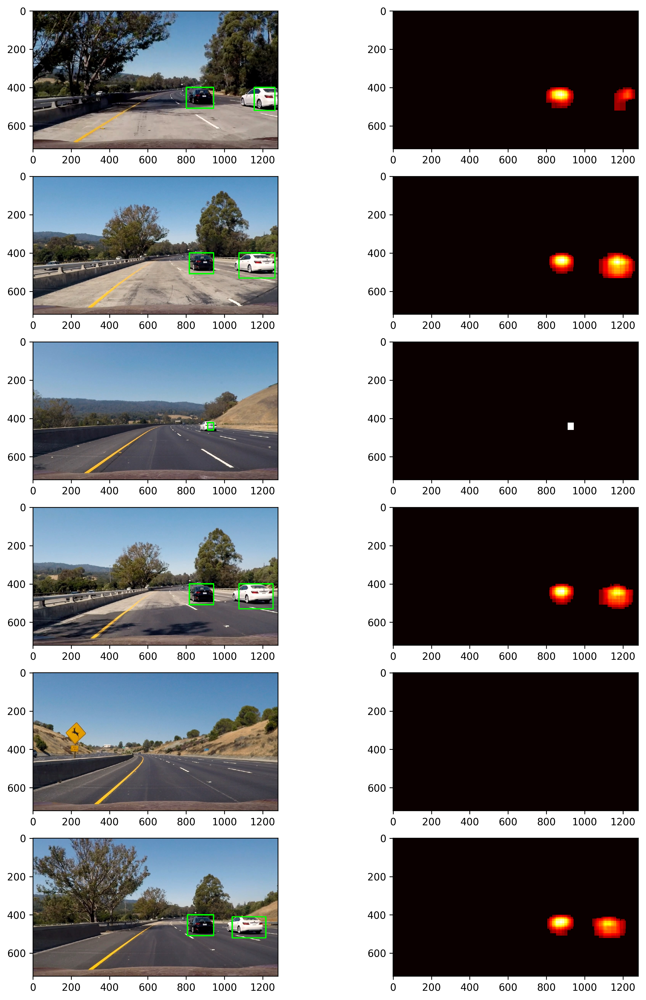

In [64]:
 def normalize_heatmap(heatmap, a = 0, b = 255):
        min_v = np.min(heatmap)
        max_v = np.max(heatmap)

        heatmap = a + ((heatmap - min_v) * (b - a)) / (max_v - min_v)

        return heatmap.astype(np.uint8)
    
def add_heat(heatmap, bbox_list):
    for box in bbox_list:
        heatmap[box[0][1]:box[1][1], box[0][0]:box[1][0]] += 1

    return heatmap    
    
# Apply threshold to help remove false positives
def apply_threshold(heatmap, threshold):
    # Zero out pixels below the threshold
    heatmap[heatmap <= threshold] = 0
    return heatmap

def draw_labeled_bboxes(img, labels):
    for car_number in range(1, labels[1]+1):
        # Find pixels with each car_number label value
        nonzero = (labels[0] == car_number).nonzero()
        # Identify x and y values of those pixels
        nonzeroy = np.array(nonzero[0])
        nonzerox = np.array(nonzero[1])
        # Define a bounding box based on min/max x and y
        bbox = ((np.min(nonzerox), np.min(nonzeroy)), (np.max(nonzerox), np.max(nonzeroy)))
        cv2.rectangle(img, bbox[0], bbox[1], (0,255,0), 6)
    return img



result_list = []
titles = []

test_images = glob.glob('./test_images/test*.jpg')
for img in test_images:
    #t1 = time.time()
    img = mpimg.imread(img)
    bboxes = []
    yaxis = [[400, 460], [410, 480], [400, 500], [420, 556], [430,556], [440, 556], [400, 556], [500,656], [400, 656]]
    scale_list = [0.7, 0.8, 1.0, 1.4, 1.6, 1.8, 1.9, 2.2, 3.0, 1.5]
    
    # get bboxlist
    for ydata, scale in zip(yaxis, scale_list):
            draw_img, bbox  = find_cars(img, ydata[0], ydata[1], scale, clf, X_scaler, orient, pix_per_cell, cell_per_block, spatial_size, hist_bins)
            bboxes.extend(bbox)
        
    heat = np.zeros_like(img[:,:,0]).astype(np.float)
    heat = add_heat(heat, bboxes)
    #heat = normalize_heatmap(heat)
    heat = apply_threshold(heat, 5)
    # Visualize the heatmap when displaying    
    heatmap = np.clip(heat, 0, 255)
    #heatmap = normalize_heatmap(heat)
    # Find final boxes from heatmap using label function
    labels = label(heatmap)
    draw_img = draw_labeled_bboxes(np.copy(img), labels)
    result_list.append(draw_img)
    result_list.append(heatmap)
    titles.append('')
    titles.append('')
    #print(time.time()-t1, 'seconds to process one image searching')
    
fig = plt.figure(figsize=(12,18), dpi=300)
visualize(fig, 6, 2, result_list, titles)
plt.savefig('heamap_order.png', bbox_inches = 'tight')

In [55]:
cache = deque(maxlen = 25)

def process_image(img):
    
        
    bboxes = []
    # parameters
    #yaxis = [[380, 530], [380, 520], [400, 500], [420, 556], [430,556], [440, 556], [400, 556], [500,656], [400, 656], [400, 656]]
    #scale_list = [0.7, 0.8, 1.0, 1.4, 1.6, 1.8, 1.9, 2.2, 3.0, 1.5]
    
    yaxis = [[380, 530], [380, 620], [380, 656]]
    scale_list = [1.0, 1.5, 1.8]
    
    # get bboxlist
    for ydata, scale in zip(yaxis, scale_list):
            draw_img, bbox  = find_cars(img, ydata[0], ydata[1], scale, clf, X_scaler, orient, pix_per_cell, cell_per_block, spatial_size, hist_bins)
            bboxes.extend(bbox)
    
    # add heatmap
    heat = np.zeros_like(img[:,:,0]).astype(np.float)
    heat = add_heat(heat, bboxes)
    
    # frame counter
    cache.append(heat)
    heatmap = np.zeros_like(heat).astype(np.float32)
    
    #use the average of collected boxes from previous frame
    for heat in cache:
        heatmap = heatmap + heat
        
    heatmap = apply_threshold(heatmap, 75)
    heatmap = np.clip(heatmap, 0, 255)
    
    #find final boxes from heatmap using label function
    labels, num_features = label(heatmap)
    draw_img = draw_labeled_bboxes(np.copy(img), (labels, num_features))
    
    return draw_img

In [56]:
cache = deque(maxlen = 25)
from moviepy.editor import VideoFileClip
from IPython.display import HTML

#frame_count = 0
#Vehicle = Vehicle()
test_output = 'test_result_5.mp4'
clip = VideoFileClip("test_video.mp4")
video_clip = clip.fl_image(process_image)
%time video_clip.write_videofile(test_output, audio=False)

[MoviePy] >>>> Building video test_result_5.mp4
[MoviePy] Writing video test_result_5.mp4


 97%|█████████▋| 38/39 [00:45<00:01,  1.19s/it]


[MoviePy] Done.
[MoviePy] >>>> Video ready: test_result_5.mp4 

CPU times: user 46.3 s, sys: 480 ms, total: 46.8 s
Wall time: 46.1 s


In [57]:
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(test_output))

In [58]:
cache = deque(maxlen = 25)
project_output = 'project_result_final_v3.mp4'
clip = VideoFileClip("project_video.mp4")
video_clip = clip.fl_image(process_image)
video_clip.write_videofile(project_output, audio=False)

[MoviePy] >>>> Building video project_result_final_v3.mp4
[MoviePy] Writing video project_result_final_v3.mp4


100%|█████████▉| 1260/1261 [25:55<00:01,  1.23s/it]


[MoviePy] Done.
[MoviePy] >>>> Video ready: project_result_final_v3.mp4 



In [59]:
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(project_output))